In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch

In [2]:
from scipy.special import gamma
from scipy.linalg import expm, sqrtm, logm
from scipy.stats import multivariate_normal as mv_norm
from scipy.stats import wishart, chi2

%matplotlib inline

In [3]:
# Make inline plots vector graphics
from IPython.display import set_matplotlib_formats

set_matplotlib_formats("pdf", "svg")

#matplotlib.rc("font", **{"family": "serif", "serif": ["Computer Modern"]})
plt.rcParams["text.usetex"] = True
plt.rcParams["text.latex.preamble"] = r"\usepackage{amsfonts} \usepackage{amsmath}"

In [4]:
def is_pos_def(x):
    eig = np.linalg.eigvals(x)
    pd = np.all(eig > 0)
    if not pd:
        raise(ValueError("matrix is not positive definite! Matrix: {}; Eigenvalues: {}".format(x, eig)))
    else:
        return(True)
    
def my_kron_product(A, B):
    m_1, n_1 = A.shape[0], A.shape[1]
    m_2, n_2 = B.shape[0], B.shape[1]
    K = np.zeros((m_1*m_2, n_1*n_2))
    for i in range(m_1):
        for j in range(m_2):
            for k in range(n_1):
                for l in range(n_2):
                    K[i*m_2 +j, k*n_2 + l] = A[i,k] * B[j,l]
    
    return(K)
    
def my_box_product(A, B):
    m_1, n_1 = A.shape[0], A.shape[1]
    m_2, n_2 = B.shape[0], B.shape[1]
    K = np.zeros((m_1*m_2, n_1*n_2))
    for i in range(m_1):
        for j in range(m_2):
            for k in range(n_1):
                for l in range(n_2):
                    K[i*m_2 +j, k*n_1 + l] = A[i,l] * B[j,k]
    
    return(K)

# return a cut through a 2D psd_cone, given values for the 
# a_11 and a_22 position of the matrix and a constant rho
def make_2D_psd_cone_cut(a_11, a_22, rho):
    xx = []
    
    for i in range(len(a_11)):
        a_12 = rho*np.sqrt(a_11[i] * a_22[i])
        matrix = np.array([[a_11[i], a_12],[a_12, a_22[i]]])
        is_pos_def(matrix)
        xx.append(matrix)
        
    return(xx)

def multi_variate_gamma(p, a):
    a = np.pi**(p*(p-1)/4) 
    b = np.prod([gamma(a + (1-j)/2) for j in range(1, p + 1)])
    return(a*b)

def create_spd_matrix(p=2, eps=10e-3):
    
    #create two symmetric positive-definite matrices
    X_ = torch.rand(p,p)
    X_sym = (X_ + X_.T)/2
    lambda_X_min = torch.abs(torch.min(torch.eig(X_sym, False)[0])) + eps
    X_spd = X_sym + torch.eye(p) * lambda_X_min
    print("X_spd is spd: ", is_pos_def(X_spd))
    
    return(X_spd.cpu().numpy())

    

(301, 2, 2)
(301,)


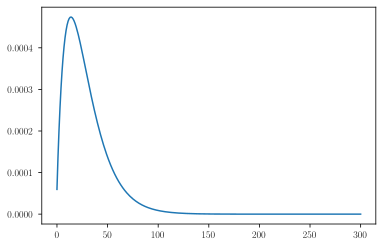

In [5]:
# test the make_2D_psd_cone_cut function
a_11 = np.linspace(0.1, 30.1, 300 +1)
a_22 = np.linspace(0.1, 60.1, 300 +1)
rho = 0

s = np.array([[4,2],
             [2,3]])
is_pos_def(s)

xx = make_2D_psd_cone_cut(a_11, a_22, rho)

w = []
print(np.shape(xx))
for x in xx:
    w_ = wishart.pdf(x, df=4, scale=s)
    w.append(w_)
print(np.shape(w))

plt.plot(w);
plt.show()

# Wishart Distribution Laplace Propagation

In [6]:
#### WARNING: these implementations are not yet optimized for performance. ########

def wishart_pdf(X, n, V):
    p = np.shape(X)[0]
    nom = np.linalg.det(X)**((n-p-1)/2) * np.exp(-np.trace(np.linalg.inv(V) @ X)/2)
    den = 2**(n*p/2) * np.linalg.det(V)**(n/2) * multi_variate_gamma(p, n/2)
    return(nom/den)

def wishart_pdf_t_sqrtm(X, n, V):
    p = np.shape(X)[0]
    nom = np.linalg.det(X)**(n-p) * np.exp(-np.trace(np.linalg.inv(V) @ (X@X.T))/2) 
    den = 2**(n*p/2) * np.linalg.det(V)**(n/2) * multi_variate_gamma(p, n/2)
    return(nom/den)

def wishart_pdf_t_logm(X, n, V):
    p = np.shape(X)[0]
    nom = np.linalg.det(expm(X))**(n-p+1)/2 * np.exp(-1/2 * np.trace(np.linalg.inv(V) @ expm(X))) 
    den = 2**(n*p/2) * np.linalg.det(V)**(n/2) * multi_variate_gamma(p, n/2)
    return(nom/den)
   
def multivariate_normal_pdf_test(X, mu, Sigma):
    k = np.shape(X)[0]
    a = (2*np.pi)**(-k/2) * np.linalg.det(Sigma)**(-1/2)
    x_mu = (X-mu).reshape(-1)
    b = np.exp(-1/2 * x_mu.T @ np.linalg.inv(Sigma) @ x_mu)
    return(a*b)

def square_mv_normal_back(X, mu, Sigma):
    X_ = sqrtm(X).reshape(-1)
    mu = mu.reshape(-1)
    return(mv_norm.pdf(X_, mu, Sigma) * np.linalg.det(sqrtm(X)))

def log_mv_normal_back(X, mu, Sigma):
    X_ = logm(X).reshape(-1)
    mu = mu.reshape(-1)
    return(mv_norm.pdf(X_, mu, Sigma) * np.linalg.det(np.linalg.inv(X)))

def wishart_mode(n, p, V):
    return((n-p-1) * V)

def wishart_Sigma(n, p, V):
    return(2*(n-p-1) * my_kron_product(V, V))

# sqrtm

def wishart_t_sqrtm_mode(n,p,V):
    return(sqrtm((n-p)*V))


def wishart_t_sqrtm_Sigma(n,p,V):
    V_inv = np.linalg.inv(V)
    V_inv_sqrtm = sqrtm(V_inv)
    I_p = np.eye(p)
    one = np.kron(V_inv_sqrtm, V_inv_sqrtm)
    two = np.kron(I_p, V_inv)
    R = np.linalg.inv(one + two)
    return(R)

# logm

def wishart_t_logm_mode(n, p, V):
    #return(logm((n-p+1) * V))
    return(logm(2*(n-p+1) * V))

def wishart_t_logm_Sigma(n, p, V):
    #return(2/(n-p+1) * np.eye(p**2))
    return((n-p+1) * np.eye(p**2))
    

## sqrtm basis

In [7]:
# function that creates a fancy plot for three different values of n
# the plot contains the original Laplace approximation, the Bridge, and a back transform

def plot_Wishart_bridge_sqrtm(xx, xxt, ns, s, filename, p=2, save=False, show_back=True):
    
    n1, n2, n3 = ns
    
    ##### normal laplace
    
    mode1 = wishart_mode(n1, p=p, V=s)
    mode2 = wishart_mode(n2, p=p, V=s)
    mode3 = wishart_mode(n3, p=p, V=s)
    #print("mode1: ", mode1)
    #print("mode2: ", mode2)
    #print("mode3: ", mode3)

    sigma1 = wishart_Sigma(n1, p=p, V=s)
    sigma2 = wishart_Sigma(n2, p=p, V=s)
    sigma3 = wishart_Sigma(n3, p=p, V=s)
    #print("sigma1: ", sigma1)
    #print("sigma2: ", sigma2)
    #print("sigma3: ", sigma3)
    
    is_pos_def(sigma1)
    is_pos_def(sigma2)
    is_pos_def(sigma3)

    w1 = []
    w2 = []
    w3 = []
    normal1 = []
    normal2 = []
    normal3 = []
    
    for x in xx:
        w_1 = wishart_pdf(X=x, n=n1, V=s)
        w_2 = wishart_pdf(X=x, n=n2, V=s)
        w_3 = wishart_pdf(X=x, n=n3, V=s)
        w1.append(w_1)
        w2.append(w_2)
        w3.append(w_3)
        w1_lpa = multivariate_normal_pdf_test(X=x, mu=mode1, Sigma=sigma1)
        w2_lpa = multivariate_normal_pdf_test(X=x, mu=mode2, Sigma=sigma2)
        w3_lpa = multivariate_normal_pdf_test(X=x, mu=mode3, Sigma=sigma3)
        normal1.append(w1_lpa)
        normal2.append(w2_lpa)
        normal3.append(w3_lpa)

    w1 = np.array(w1)
    w2 = np.array(w2)
    w3 = np.array(w3)
    
    rescale_normal1 = np.max(w1)/np.max(normal1)
    rescale_normal2 = np.max(w2)/np.max(normal2)
    rescale_normal3 = np.max(w3)/np.max(normal3)

    normal1 = np.array(normal1) * rescale_normal1
    normal2 = np.array(normal2) * rescale_normal2
    normal3 = np.array(normal3) * rescale_normal3
    

    ######### square transformation

    mode1_t_sqrtm = wishart_t_sqrtm_mode(n1, p=p, V=s)
    mode2_t_sqrtm = wishart_t_sqrtm_mode(n2, p=p, V=s)
    mode3_t_sqrtm = wishart_t_sqrtm_mode(n3, p=p, V=s)

    sigma1_t_sqrtm = wishart_t_sqrtm_Sigma(n1, p=p, V=s)
    sigma2_t_sqrtm = wishart_t_sqrtm_Sigma(n2, p=p, V=s)
    sigma3_t_sqrtm = wishart_t_sqrtm_Sigma(n3, p=p, V=s)

    is_pos_def(sigma1_t_sqrtm)
    is_pos_def(sigma2_t_sqrtm)
    is_pos_def(sigma3_t_sqrtm)

    w1_t_sqrtm = []
    w2_t_sqrtm = []
    w3_t_sqrtm = []
    w1_lpa_t_sqrtm = []
    w2_lpa_t_sqrtm = []
    w3_lpa_t_sqrtm = []

    for x in xxt:
        w_1 = wishart_pdf_t_sqrtm(X=x, n=n1, V=s)
        w_2 = wishart_pdf_t_sqrtm(X=x, n=n2, V=s)
        w_3 = wishart_pdf_t_sqrtm(X=x, n=n3, V=s)
        w1_t_sqrtm.append(w_1)
        w2_t_sqrtm.append(w_2)
        w3_t_sqrtm.append(w_3)
        #
        w1_lpa = multivariate_normal_pdf_test(X=x, mu=mode1_t_sqrtm, Sigma=sigma1_t_sqrtm)
        w2_lpa = multivariate_normal_pdf_test(X=x, mu=mode2_t_sqrtm, Sigma=sigma2_t_sqrtm)
        w3_lpa = multivariate_normal_pdf_test(X=x, mu=mode3_t_sqrtm, Sigma=sigma3_t_sqrtm)
        w1_lpa_t_sqrtm.append(w1_lpa)
        w2_lpa_t_sqrtm.append(w2_lpa)
        w3_lpa_t_sqrtm.append(w3_lpa)

    #rescale for visibility
    w1_t_sqrtm = np.array(w1_t_sqrtm)
    w2_t_sqrtm = np.array(w2_t_sqrtm)
    w3_t_sqrtm = np.array(w3_t_sqrtm)
    
    rescale1_t_sqrtm = np.max(w1_t_sqrtm)/np.max(w1_lpa_t_sqrtm)
    rescale2_t_sqrtm = np.max(w2_t_sqrtm)/np.max(w2_lpa_t_sqrtm)
    rescale3_t_sqrtm = np.max(w3_t_sqrtm)/np.max(w3_lpa_t_sqrtm)

    w1_lpa_t_sqrtm = np.array(w1_lpa_t_sqrtm) * rescale1_t_sqrtm
    w2_lpa_t_sqrtm = np.array(w2_lpa_t_sqrtm) * rescale2_t_sqrtm
    w3_lpa_t_sqrtm = np.array(w3_lpa_t_sqrtm) * rescale3_t_sqrtm 

    ######### back transform #########

    w1_back = []
    w2_back = []
    w3_back = []

    for x in xx:
        w1_back.append(square_mv_normal_back(x, mode1_t_sqrtm, sigma1_t_sqrtm))
        w2_back.append(square_mv_normal_back(x, mode2_t_sqrtm, sigma2_t_sqrtm))
        w3_back.append(square_mv_normal_back(x, mode3_t_sqrtm, sigma3_t_sqrtm))
        
    rescale_back1 = np.max(w1)/np.max(w1_back)
    rescale_back2 = np.max(w2)/np.max(w2_back)
    rescale_back3 = np.max(w3)/np.max(w3_back)

    w1_back = np.array(w1_back) * rescale_back1
    w2_back = np.array(w2_back) * rescale_back2 
    w3_back = np.array(w3_back) * rescale_back3 
    
    """Plots"""
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 15
    legend_size=14
    xlabel_size=15
    ylabel_size=15
    title_size=16
    lw = 2

    if show_back:
        fig, axs = plt.subplots(nrows=1, ncols=3, sharex=False, figsize=(10, 3))
    else:
        fig, axs = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=(10, 3))
        
    axs[0].plot(w1, 'r-', lw=lw)
    axs[0].plot(w2, 'b-', lw=lw)
    axs[0].plot(w3, 'k-', lw=lw, label="$\mathcal{W}$")
    axs[0].plot(normal1, 'r--', lw=lw)
    axs[0].plot(normal2, 'b--', lw=lw)
    axs[0].plot(normal3, 'k--', lw=lw, label="$\mathcal{N}$")
    axs[0].set_yticklabels([])
    axs[0].set_yticks([])
    axs[0].set_xlabel('$g(x)$', fontsize=xlabel_size)
    axs[0].set_ylabel('$p(g(x))dg(x)$', fontsize=ylabel_size)
    axs[0].set_title('Laplace in standard basis', fontsize=title_size)
    axs[0].legend(prop={'size': legend_size});

    axs[1].plot(w1_t_sqrtm, 'r', lw=lw)
    axs[1].plot(w2_t_sqrtm, 'b', lw=lw)
    axs[1].plot(w3_t_sqrtm, 'k', lw=lw, label="$\mathcal{W}$")
    axs[1].plot(w1_lpa_t_sqrtm, 'r--', lw=lw)
    axs[1].plot(w2_lpa_t_sqrtm, 'b--', lw=lw)
    axs[1].plot(w3_lpa_t_sqrtm, 'k--', lw=lw, label="$\mathcal{N}$")
    #axs[1].set_yticklabels([])
    #axs[1].set_yticks([])
    axs[1].set_xlabel('$g(x)$', fontsize=xlabel_size)
    axs[1].set_ylabel('$p(g(x))dg(x)$', fontsize=ylabel_size)
    axs[1].set_title('Laplace in sqrtm basis', fontsize=title_size)
    axs[1].legend(prop={'size': legend_size});

    if show_back:
        axs[2].plot(w1, 'r-', lw=lw)
        axs[2].plot(w2, 'b-', lw=lw)
        axs[2].plot(w3, 'k-', lw=lw, label="$\mathcal{W}$")
        axs[2].plot(w1_back, 'r--', lw=lw)
        axs[2].plot(w2_back, 'b--', lw=lw)
        axs[2].plot(w3_back, 'k--', lw=lw, label="$\mathcal{N}$")
        axs[2].set_yticklabels([])
        axs[2].set_yticks([])
        axs[2].set_xlabel('$g(x)$', fontsize=xlabel_size)
        axs[2].set_ylabel('$p(g(x))dg(x)$', fontsize=ylabel_size)
        axs[2].set_title('Back to standard basis', fontsize=title_size)
        axs[2].legend(prop={'size': legend_size});
    
    plt.tight_layout()

    if save:
        plt.savefig(filename)
    plt.show();

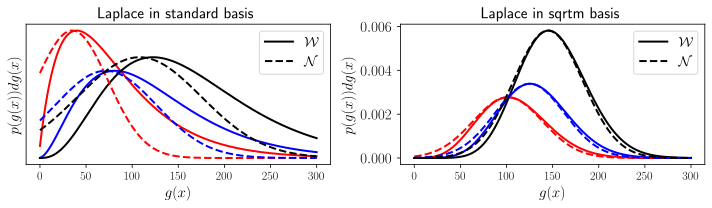

In [8]:
# test the function for one value of rho and s

""" values """
a_11 = np.linspace(0.1, 20.1, 300 +1)
a_22 = np.linspace(0.1, 20.1, 300 +1)

a_11_t = np.linspace(0.1, 7.1, 300 +1)
a_22_t = np.linspace(0.1, 7.1, 300 +1)

s = np.array([[4,2],
             [2,3]])

#s = np.array([[5,3],
#             [3,4]])

#s = 2*np.eye(2)
is_pos_def(s)

r = 0.3
xx = make_2D_psd_cone_cut(a_11, a_22, r)
xxt = make_2D_psd_cone_cut(a_11_t, a_22_t, r)

n1 = 4
n2 = 5
n3 = 6

p=2

plot_Wishart_bridge_sqrtm(xx=xx, xxt=xxt, ns=[n1,n2,n3], s=s, p=2, save=False, filename='wishart_sqrtm_bridge_wo_back.pdf', show_back=False)

-0.9


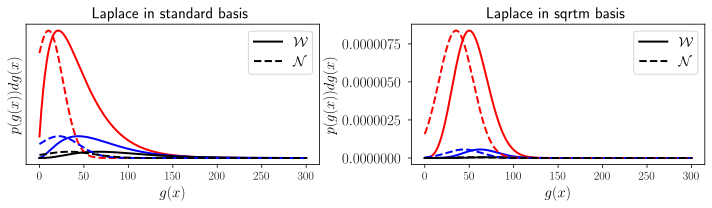

-0.8


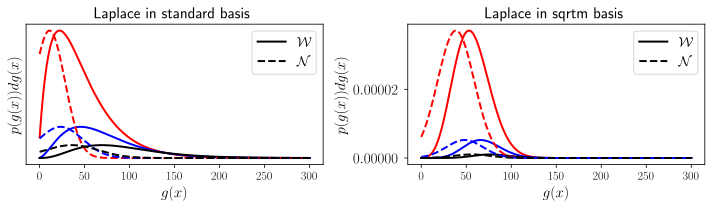

-0.7


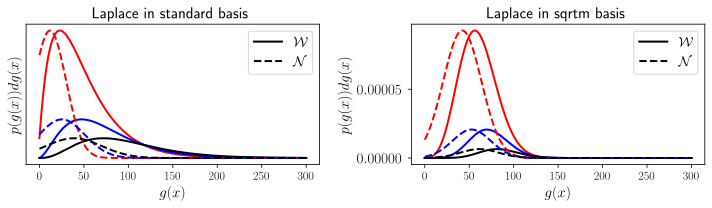

-0.6


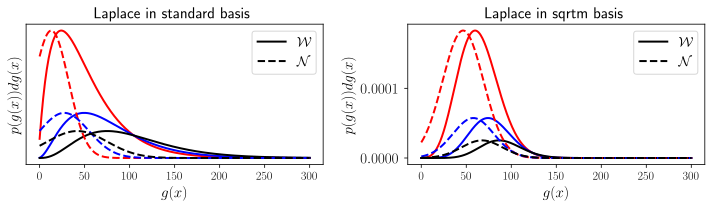

-0.5


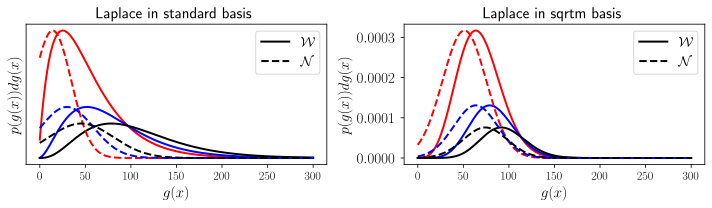

-0.4


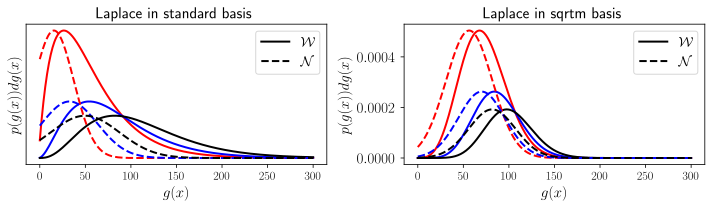

-0.29999999999999993


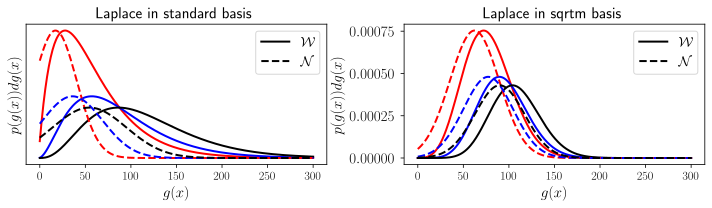

-0.19999999999999996


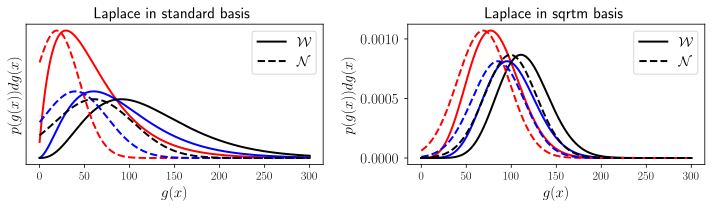

-0.09999999999999998


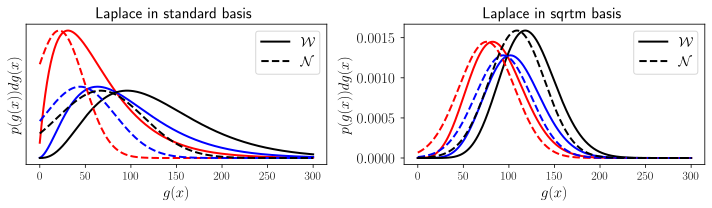

0.0


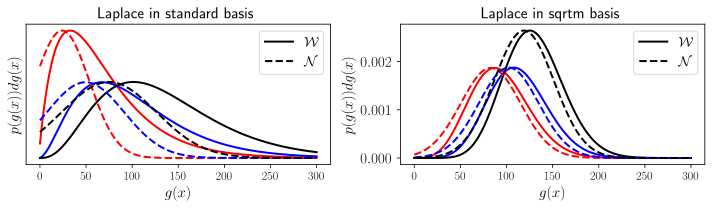

0.09999999999999998


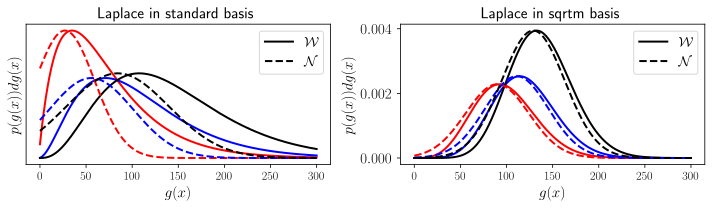

0.20000000000000007


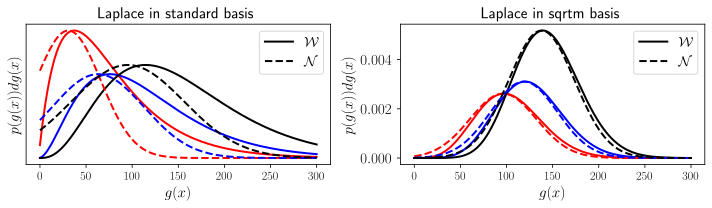

0.30000000000000016


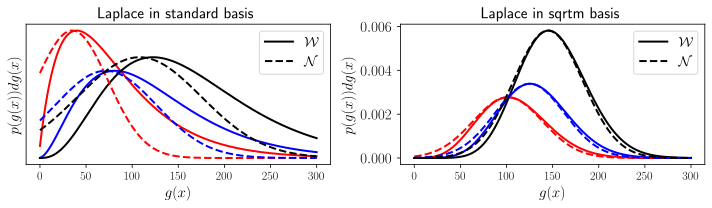

0.4


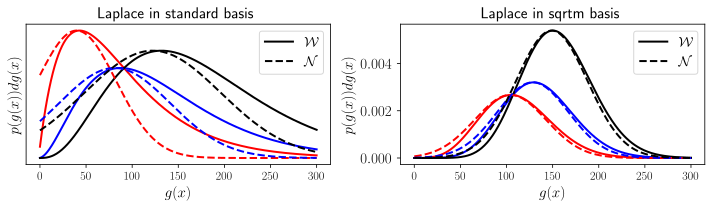

0.5000000000000001


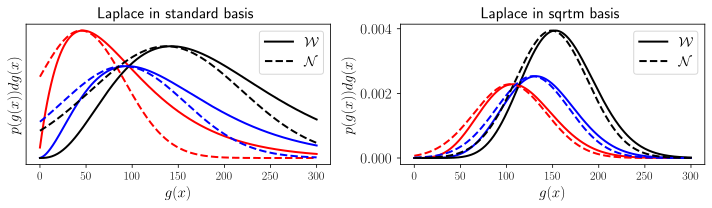

0.6


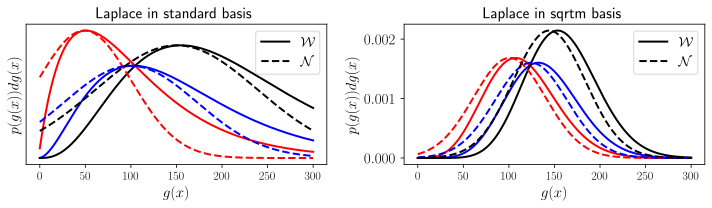

0.7000000000000001


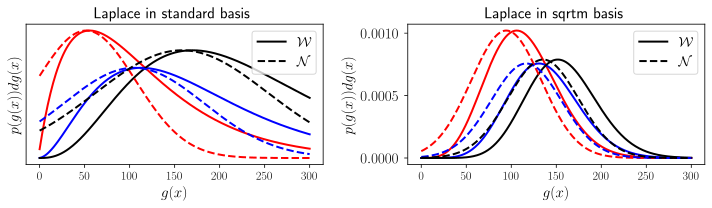

0.8000000000000002


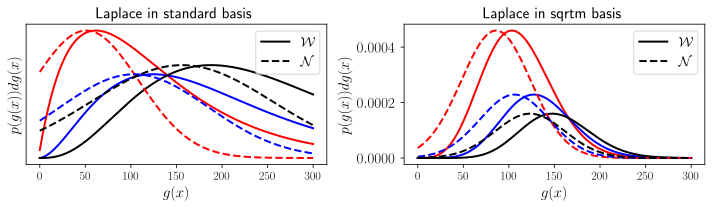

0.9


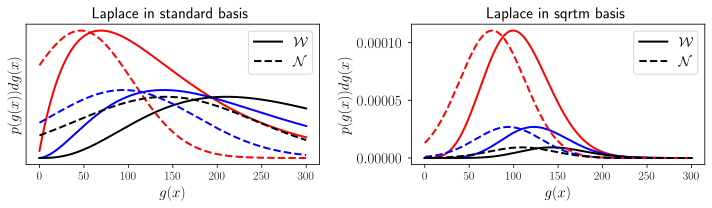

In [9]:
# test the function for multiple values of rho and s

""" values """

#s = np.eye(2)*2

s = np.array([[4,2],
             [2,3]])

#s = np.array([[5,3],
#             [3,4]])

n1 = 4
n2 = 5
n3 = 6

p=2

rhos = np.linspace(-0.9, 0.9, 19)

for r in rhos:
    
    print(r)
    xx = make_2D_psd_cone_cut(a_11, a_22, r)
    xxt = make_2D_psd_cone_cut(a_11_t, a_22_t, r)
    plot_Wishart_bridge_sqrtm(xx=xx, xxt=xxt, ns=[n1,n2,n3], s=s, p=2, save=False, filename='', show_back=False)

## logm basis

In [10]:
def wishart_t_logm_mode(n, p, V):
    #return(logm((n-p+1) * V))
    return(logm((n-p+1) * V))

def wishart_t_logm_Sigma(n, p, V):
    #return(2/(n-p+1) * np.eye(p**2))
    return(2/(n-p+1) * np.eye(p**2))
    

In [11]:
# function that creates a fancy plot for three different values of n
# the plot contains the original Laplace approximation, the Bridge, and a back transform

def plot_Wishart_bridge_logm(xx, xxt, ns, s, filename, p=2, save=False, show_back=True):
    
    n1, n2, n3 = ns
    
    ##### normal laplace
    
    mode1 = wishart_mode(n1, p=p, V=s)
    mode2 = wishart_mode(n2, p=p, V=s)
    mode3 = wishart_mode(n3, p=p, V=s)
    #print("mode1: ", mode1)
    #print("mode2: ", mode2)
    #print("mode3: ", mode3)

    sigma1 = wishart_Sigma(n1, p=p, V=s)
    sigma2 = wishart_Sigma(n2, p=p, V=s)
    sigma3 = wishart_Sigma(n3, p=p, V=s)
    #print("sigma1: ", sigma1)
    #print("sigma2: ", sigma2)
    #print("sigma3: ", sigma3)
    
    is_pos_def(sigma1)
    is_pos_def(sigma2)
    is_pos_def(sigma3)

    w1 = []
    w2 = []
    w3 = []
    normal1 = []
    normal2 = []
    normal3 = []

    print(np.shape(xx))
    for x in xx:
        w_1 = wishart_pdf(X=x, n=n1, V=s)
        w_2 = wishart_pdf(X=x, n=n2, V=s)
        w_3 = wishart_pdf(X=x, n=n3, V=s)
        w1.append(w_1)
        w2.append(w_2)
        w3.append(w_3)
        w1_lpa = multivariate_normal_pdf_test(X=x, mu=mode1, Sigma=sigma1)
        w2_lpa = multivariate_normal_pdf_test(X=x, mu=mode2, Sigma=sigma2)
        w3_lpa = multivariate_normal_pdf_test(X=x, mu=mode3, Sigma=sigma3)
        normal1.append(w1_lpa)
        normal2.append(w2_lpa)
        normal3.append(w3_lpa)

    w1 = np.array(w1)
    w2 = np.array(w2)
    w3 = np.array(w3)
    
    rescale_normal1 = np.max(w1)/np.max(normal1)
    rescale_normal2 = np.max(w2)/np.max(normal2)
    rescale_normal3 = np.max(w3)/np.max(normal3)

    normal1 = np.array(normal1) * rescale_normal1
    normal2 = np.array(normal2) * rescale_normal2
    normal3 = np.array(normal3) * rescale_normal3
    

    ######### logm transformation

    mode1_t_logm = wishart_t_logm_mode(n1, p=p, V=s)
    mode2_t_logm = wishart_t_logm_mode(n2, p=p, V=s)
    mode3_t_logm = wishart_t_logm_mode(n3, p=p, V=s)

    sigma1_t_logm = wishart_t_logm_Sigma(n1, p=p, V=s)
    sigma2_t_logm = wishart_t_logm_Sigma(n2, p=p, V=s)
    sigma3_t_logm = wishart_t_logm_Sigma(n3, p=p, V=s)

    is_pos_def(sigma1_t_logm)
    is_pos_def(sigma2_t_logm)
    is_pos_def(sigma3_t_logm)

    w1_t_logm = []
    w2_t_logm = []
    w3_t_logm = []
    w1_lpa_t_logm = []
    w2_lpa_t_logm = []
    w3_lpa_t_logm = []

    for x in xxt:
        w_1 = wishart_pdf_t_logm(X=x, n=n1, V=s)
        w_2 = wishart_pdf_t_logm(X=x, n=n2, V=s)
        w_3 = wishart_pdf_t_logm(X=x, n=n3, V=s)
        w1_t_logm.append(w_1)
        w2_t_logm.append(w_2)
        w3_t_logm.append(w_3)
        #
        w1_lpa = multivariate_normal_pdf_test(X=x, mu=mode1_t_logm, Sigma=sigma1_t_logm)
        w2_lpa = multivariate_normal_pdf_test(X=x, mu=mode2_t_logm, Sigma=sigma2_t_logm)
        w3_lpa = multivariate_normal_pdf_test(X=x, mu=mode3_t_logm, Sigma=sigma3_t_logm)
        w1_lpa_t_logm.append(w1_lpa)
        w2_lpa_t_logm.append(w2_lpa)
        w3_lpa_t_logm.append(w3_lpa)

    #rescale for visibility
    w1_t_logm = np.array(w1_t_logm)
    w2_t_logm = np.array(w2_t_logm)
    w3_t_logm = np.array(w3_t_logm)
    
    rescale1_t_logm = np.max(w1_t_logm)/np.max(w1_lpa_t_logm)
    rescale2_t_logm = np.max(w2_t_logm)/np.max(w2_lpa_t_logm)
    rescale3_t_logm = np.max(w3_t_logm)/np.max(w3_lpa_t_logm)

    w1_lpa_t_logm = np.array(w1_lpa_t_logm) * rescale1_t_logm
    w2_lpa_t_logm = np.array(w2_lpa_t_logm) * rescale2_t_logm
    w3_lpa_t_logm = np.array(w3_lpa_t_logm) * rescale3_t_logm

    ######### back transform #########

    w1_back = []
    w2_back = []
    w3_back = []

    for x in xx:
        w1_back.append(log_mv_normal_back(x, mode1_t_logm, sigma1_t_logm))
        w2_back.append(log_mv_normal_back(x, mode2_t_logm, sigma2_t_logm))
        w3_back.append(log_mv_normal_back(x, mode3_t_logm, sigma3_t_logm))
        
    rescale_back1 = np.max(w1)/np.max(w1_back)
    rescale_back2 = np.max(w2)/np.max(w2_back)
    rescale_back3 = np.max(w3)/np.max(w3_back)

    w1_back = np.array(w1_back) * rescale_back1
    w2_back = np.array(w2_back) * rescale_back2 
    w3_back = np.array(w3_back) * rescale_back3 

    """Plots"""
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 15
    legend_size=14
    xlabel_size=15
    ylabel_size=15
    title_size=16
    lw = 2

    if show_back:
        fig, axs = plt.subplots(nrows=1, ncols=3, sharex=False, figsize=(10, 3))
    else:
        fig, axs = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=(10, 3))
        
    axs[0].plot(w1, 'r-', lw=lw)
    axs[0].plot(w2, 'b-', lw=lw)
    axs[0].plot(w3, 'k-', lw=lw, label="$\mathcal{W}$")
    axs[0].plot(normal1, 'r--', lw=lw)
    axs[0].plot(normal2, 'b--', lw=lw)
    axs[0].plot(normal3, 'k--', lw=lw, label="$\mathcal{N}$")
    #axs[0].set_yticklabels([])
    #axs[0].set_yticks([])
    axs[0].set_xlabel('$g(x)$', fontsize=xlabel_size)
    axs[0].set_ylabel('$p(g(x))dg(x)$', fontsize=ylabel_size)
    axs[0].set_title('Laplace in standard basis', fontsize=title_size)
    axs[0].legend(prop={'size': legend_size});

    axs[1].plot(w1_t_logm, 'r', lw=lw)
    axs[1].plot(w2_t_logm, 'b', lw=lw)
    axs[1].plot(w3_t_logm, 'k', lw=lw, label="$\mathcal{W}$")
    axs[1].plot(w1_lpa_t_logm, 'r--', lw=lw)
    axs[1].plot(w2_lpa_t_logm, 'b--', lw=lw)
    axs[1].plot(w3_lpa_t_logm, 'k--', lw=lw, label="$\mathcal{N}$")
    #axs[1].set_yticklabels([])
    #axs[1].set_yticks([])
    axs[1].set_xlabel('$g(x)$', fontsize=xlabel_size)
    axs[1].set_ylabel('$p(g(x))dg(x)$', fontsize=ylabel_size)
    axs[1].set_title('Laplace in logm basis', fontsize=title_size)
    axs[1].legend(prop={'size': legend_size});

    if show_back:
        axs[2].plot(w1, 'r-', lw=lw)
        axs[2].plot(w2, 'b-', lw=lw)
        axs[2].plot(w3, 'k-', lw=lw, label="$\mathcal{W}$")
        axs[2].plot(w1_back, 'r--', lw=lw)
        axs[2].plot(w2_back, 'b--', lw=lw)
        axs[2].plot(w3_back, 'k--', lw=lw, label="$\mathcal{N}$")
        axs[2].set_yticklabels([])
        axs[2].set_yticks([])
        axs[2].set_xlabel('$g(x)$', fontsize=xlabel_size)
        axs[2].set_ylabel('$p(g(x))dg(x)$', fontsize=ylabel_size)
        axs[2].set_title('Back to standard basis', fontsize=title_size)
        axs[2].legend(prop={'size': legend_size});
    
    plt.tight_layout()

    if save:
        plt.savefig(filename)
    plt.show();

[[2. 0.]
 [0. 2.]]
(301, 2, 2)


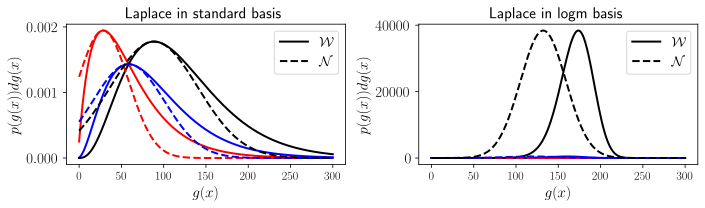

In [12]:
# test the function for one value of rho and s

""" values """
a_11 = np.linspace(0.1, 20.1, 300 +1)
a_22 = np.linspace(0.1, 20.1, 300 +1)

a_11_t = np.linspace(0.1, 5.1, 300 +1)
a_22_t = np.linspace(0.1, 5.1, 300 +1)

#s = np.array([[4,2],
#             [2,3]])

#s = np.array([[5,3],
#             [3,4]])

s = 2*np.eye(2)

#s = create_spd_matrix(eps=3)
print(s)

is_pos_def(s)

r = 0.0
xx = make_2D_psd_cone_cut(a_11, a_22, r)
xxt = make_2D_psd_cone_cut(a_11_t, a_22_t, r)

n1 = 4
n2 = 5
n3 = 6

p=2

plot_Wishart_bridge_logm(xx=xx, xxt=xxt, ns=[n1,n2,n3], s=s, p=2, save=False, 
                         filename='wishart_logm_bridge.pdf', show_back=False)


-0.9
(301, 2, 2)


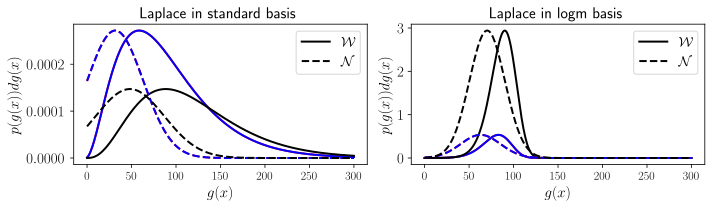

-0.8
(301, 2, 2)


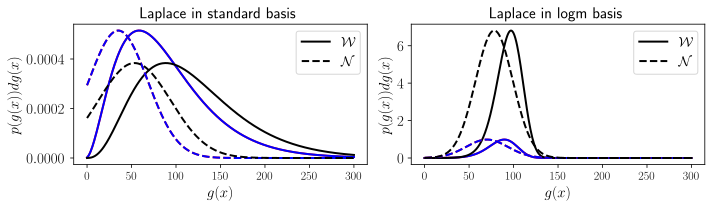

-0.7
(301, 2, 2)


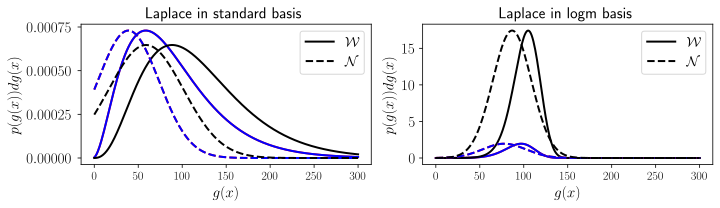

-0.6
(301, 2, 2)


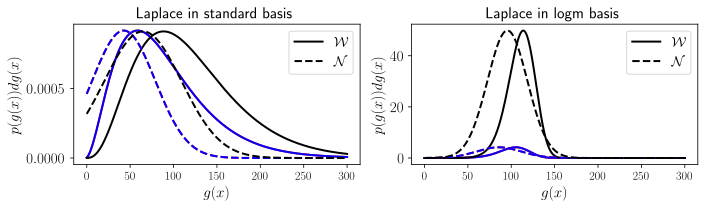

-0.5
(301, 2, 2)


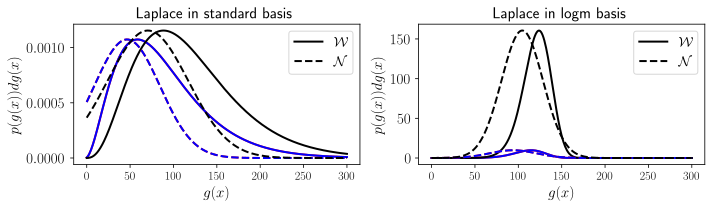

-0.4
(301, 2, 2)


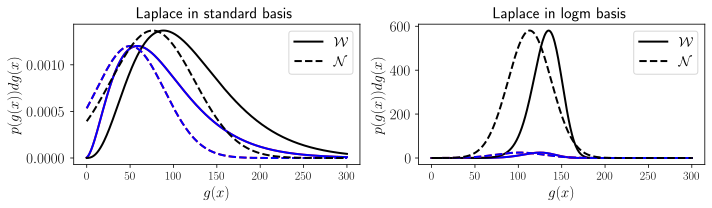

-0.29999999999999993
(301, 2, 2)


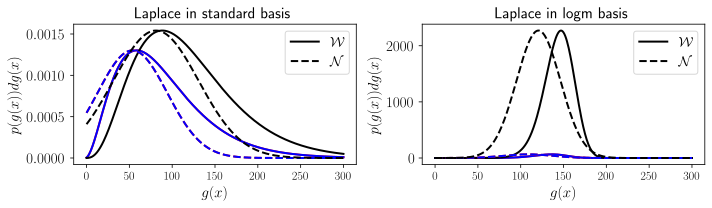

-0.19999999999999996
(301, 2, 2)


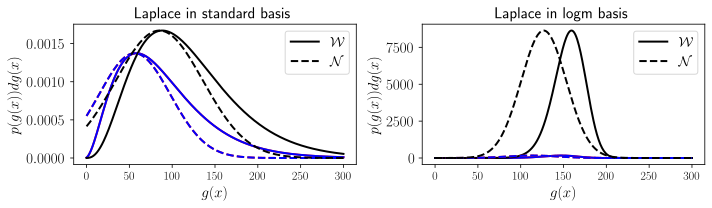

-0.09999999999999998
(301, 2, 2)


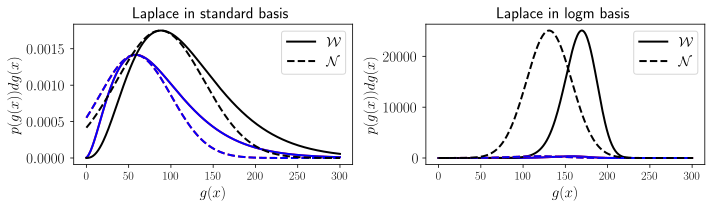

0.0
(301, 2, 2)


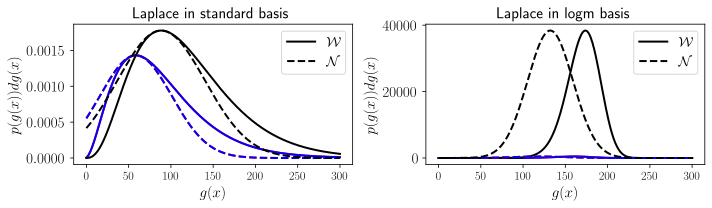

0.09999999999999998
(301, 2, 2)


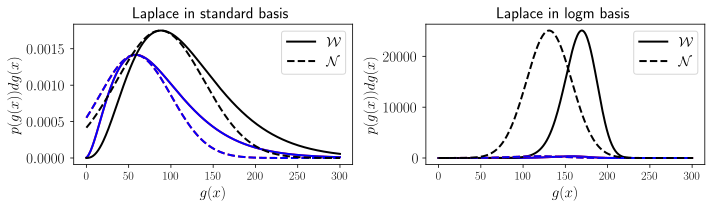

0.20000000000000007
(301, 2, 2)


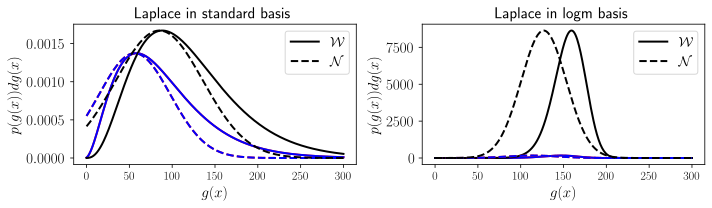

0.30000000000000016
(301, 2, 2)


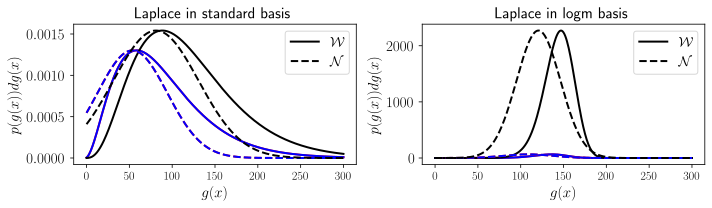

0.4
(301, 2, 2)


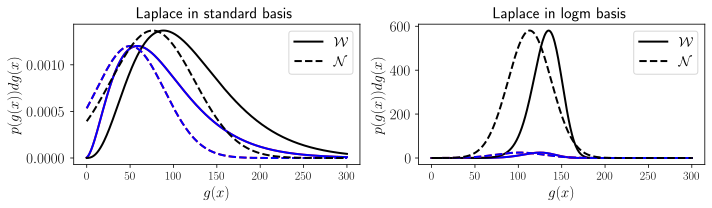

0.5000000000000001
(301, 2, 2)


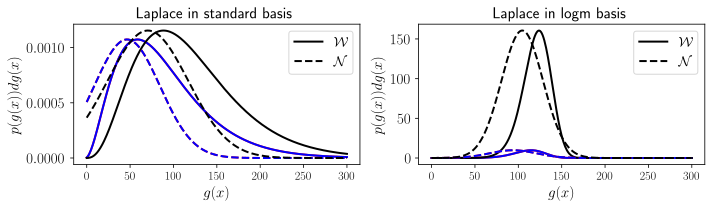

0.6
(301, 2, 2)


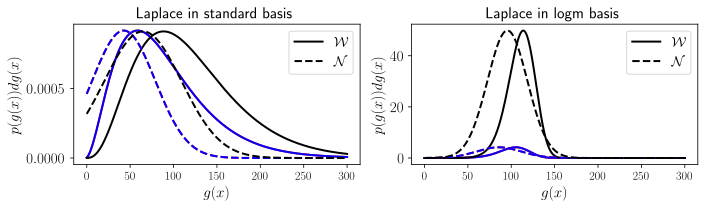

0.7000000000000001
(301, 2, 2)


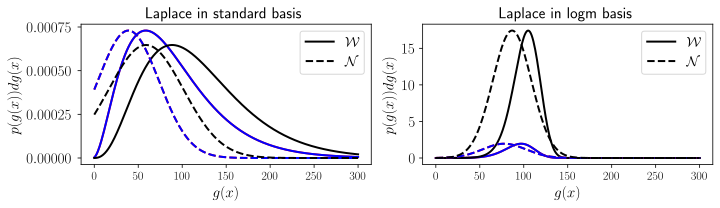

0.8000000000000002
(301, 2, 2)


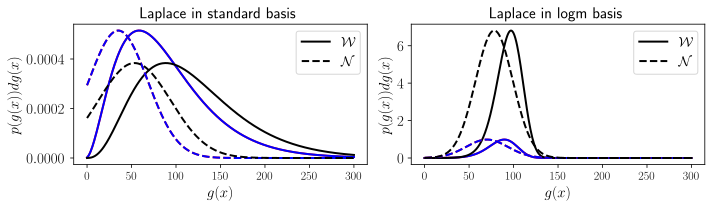

0.9
(301, 2, 2)


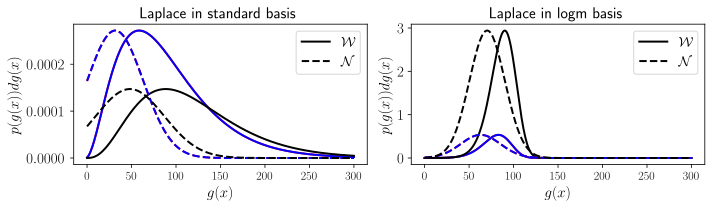

In [13]:
# test the function for multiple values of rho and s

""" values """

s = np.eye(2)*2

#s = np.array([[4,2],
#             [2,3]])

#s = np.array([[5,3],
#             [3,4]])

is_pos_def(s)

n1 = 5
n2 = 5
n3 = 6

p=2

rhos = np.linspace(-0.9, 0.9, 19)

for r in rhos:
    
    print(r)
    xx = make_2D_psd_cone_cut(a_11, a_22, r)
    xxt = make_2D_psd_cone_cut(a_11_t, a_22_t, r)
    plot_Wishart_bridge_logm(xx=xx, xxt=xxt, ns=[n1,n2,n3], s=s, p=2, save=False, 
                             filename='delete.pdf', show_back=False)

# Verify the Bridge

In [14]:
n_test = 5
p_test = 2
s_test = np.array([[4,2],
                   [2,3]])

is_pos_def(s_test)

def wishart_t_logm_mode(n, p, V):
    return(logm((n-p+1) * V))

def wishart_t_logm_Sigma(n, p, V):
    return(2/(n-p+1) * np.eye(p**2))

def wishart_t_logm_V_from_mS(mu, Sigma, p, n):
    mu_ = mu.reshape(p,p)
    return(expm(mu_)/(n-p+1))

def wishart_t_logm_n_from_mS(mu, Sigma, p, V):
    mu_ = mu.reshape(p,p)
    return(expm(mu)@np.linalg.inv(V) + (p-1)*np.eye(p))

def wishart_t_logm_n_from_mS2(mu, Sigma, p):
    S_inv = np.linalg.inv(Sigma)
    print("S_inv: ", S_inv)
    return(2*S_inv + (p-1)*np.eye(p**2))

m_test = wishart_t_logm_mode(n_test, p_test, s_test)
S_test = wishart_t_logm_Sigma(n_test, p_test, s_test)
V_test = wishart_t_logm_V_from_mS(m_test, S_test, p_test, n_test)
print("m_test: ", m_test)
print("S_test: ", S_test)

n2_test = wishart_t_logm_n_from_mS(m_test, S_test, p_test, V_test)
n3_test = wishart_t_logm_n_from_mS2(m_test, S_test, p_test)

print(V_test)
print(n2_test)
print(n3_test)

m_test:  [[2.59000719 0.65596824]
 [0.65596824 2.26202307]]
S_test:  [[0.5 0.  0.  0. ]
 [0.  0.5 0.  0. ]
 [0.  0.  0.5 0. ]
 [0.  0.  0.  0.5]]
S_inv:  [[2. 0. 0. 0.]
 [0. 2. 0. 0.]
 [0. 0. 2. 0.]
 [0. 0. 0. 2.]]
[[4. 2.]
 [2. 3.]]
[[5. 0.]
 [0. 5.]]
[[5. 0. 0. 0.]
 [0. 5. 0. 0.]
 [0. 0. 5. 0.]
 [0. 0. 0. 5.]]


In [15]:
import scipy
X_test = create_spd_matrix(p=4)
X_test = 1/2 * X_test + X_test.T
m_ = np.random.random((4))
n2_test_matrix = wishart_t_logm_n_from_mS2(m_, X_test, p=2)
V2_test = wishart_t_logm_V_from_mS(m_, X_test, 2, n2_test)
print("X_test: ", X_test)
print("V2_test: ", V2_test)
print("m_: ", m_)
print("n2_test: ", n2_test_matrix)
U, sing, V = scipy.linalg.svd(n2_test_matrix)
print("singular values: ", sing)
print("U: ", U)
print("V: ", V)
r1_approx = sing[0] * np.outer(U[0], V[0])
#print("rank-1 approx: ", r1_approx)
#print("rank-1 diagonal: ", r1_approx.diagonal())

eigs = np.linalg.eigvals(n2_test_matrix)
print("eigs: ", eigs)
n2_test_val = np.sqrt(np.sum(sing**2) - sing[0]**2- sing[1]**2)
n2_test_val_1 = np.sum(sing**2) - sing[0]**2
#n2_test_val = eigs.mean()
#n2_test_val = n2_test_matrix.diagonal().min()

m2_test = wishart_t_logm_mode(n2_test_val, 2, V2_test)
S2_test = wishart_t_logm_Sigma(n2_test_val, 2, V2_test)
m2_test_1 = wishart_t_logm_mode(n_test, 2, V2_test)
S2_test_1 = wishart_t_logm_Sigma(n2_test_val_1, 2, V2_test)

print("m': ", m2_test)
print("X': ", S2_test)
print("m2': ", m2_test_1)
print("X2': ", S2_test_1)


X_spd is spd:  True
S_inv:  [[  5.0731945 -15.020596    6.6579485   2.8585951]
 [-15.020596   50.14306   -22.002514  -10.7032995]
 [  6.6579485 -22.002514   10.234618    4.310506 ]
 [  2.8585951 -10.7032995   4.310506    3.3519857]]
X_test:  [[2.2092628  0.9674648  0.29471427 0.82616997]
 [0.9674648  1.0908837  1.3007332  0.98557913]
 [0.29471427 1.3007332  2.3099935  0.93151593]
 [0.82616997 0.98557913 0.93151593 1.5429536 ]]
V2_test:  [[ 0.31748773 -1.46738569]
 [-0.21117554  0.55678835]]
m_:  [0.17008685 0.89448603 0.12872796 0.75357644]
n2_test:  [[ 11.14638901 -30.0411911   13.31589699   5.71719027]
 [-30.0411911  101.28611755 -44.00502777 -21.40659904]
 [ 13.31589699 -44.00502777  21.46923637   8.62101173]
 [  5.71719027 -21.40659904   8.62101173   7.70397139]]
singular values:  [134.3343145    3.80538059   2.01755757   1.44846167]
U:  [[-0.26129649 -0.34694258  0.77445396  0.45997398]
 [ 0.86670154 -0.0844776  -0.03660431  0.49025718]
 [-0.38282981 -0.36793767 -0.63035176  0.566

# Visualization

we follow the 4-layer visualization approach by Gelman (http://www.stat.columbia.edu/~gelman/research/unpublished/Visualization.pdf)

In [16]:
from scipy.stats import wishart

In [17]:
s = np.array([[4,2],
             [2,3]])

n1 = 5

num_samples=25000

wishart_samples = wishart.rvs(df=n1, scale=s, size=num_samples, random_state=None)
wishart_samples_1000 = wishart.rvs(df=n1, scale=s, size=1000, random_state=None)

In [18]:
print(np.shape(wishart_samples))
print(wishart_samples[0])

(25000, 2, 2)
[[15.98028071  5.5058054 ]
 [ 5.5058054  16.5764985 ]]


In [19]:
sigma_00 = np.sqrt(wishart_samples[:,0,0])
sigma_11 = np.sqrt(wishart_samples[:,1,1])
sigma_01 = wishart_samples[:,0,1]
rho_01 = sigma_01/(sigma_00 * sigma_11)

In [20]:
def plot_histograms(samples_2D, sqrt=True):
    
    #get values
    samples_flat = samples_2D.reshape(len(samples_2D), -1)
    if sqrt:
        sigma_00 = np.sqrt(samples_flat[:,0]) 
    else:
        sigma_00 = samples_flat[:,0]
    sigma_01 = samples_flat[:,1]
    sigma_10 = samples_flat[:,2]
    if sqrt:
        sigma_11 = np.sqrt(samples_flat[:,3])
    else:
        sigma_11 = samples_flat[:,3]
    rho_01 = sigma_01/(sigma_00 * sigma_11)  
    rho_10 = sigma_10/(sigma_00 * sigma_11)  
    
    #plot values
    fig, axs = plt.subplots(nrows=3, ncols=2, sharex=False, figsize=(12, 17))
    axs[0][0].hist(sigma_00, bins=100)
    axs[0][0].set_title("sigma_00")
    axs[0][1].hist(sigma_01, bins=100)
    axs[0][1].set_title("sigma_01")
    axs[1][0].hist(sigma_10, bins=100)
    axs[1][0].set_title("sigma_10")
    axs[1][1].hist(sigma_11, bins=100)
    axs[1][1].set_title("sigma_11")
    axs[2][0].hist(rho_01, bins=100)
    axs[2][0].set_title("rho_01")
    axs[2][1].hist(rho_10, bins=100)
    axs[2][1].set_title("rho_10")
    
    plt.show()

In [21]:
plot_histograms(wishart_samples, sqrt=True)

RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

)
No file 2ea497fb454e27a0a5546c758e602659.aux.
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./2ea497fb454e27a0a5546c758e602659.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




<Figure size 864x1224 with 6 Axes>

In [22]:
wishart_samples_sqrtm = np.array([sqrtm(x) for x in wishart_samples])
wishart_samples_1000_sqrtm = np.array([sqrtm(x) for x in wishart_samples_1000])
print(np.shape(wishart_samples_sqrtm))
print(wishart_samples_sqrtm[0])

(25000, 2, 2)
[[3.9370734  0.69262813]
 [0.69262813 4.01207736]]


In [23]:
plot_histograms(wishart_samples_sqrtm, sqrt=False)

RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./2ea497fb454e27a0a5546c758e602659.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./2ea497fb454e27a0a5546c758e602659.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




<Figure size 864x1224 with 6 Axes>

In [24]:
wishart_samples_logm = np.array([logm(x) for x in wishart_samples])
print(np.shape(wishart_samples_logm))
print(wishart_samples_logm[0])

(25000, 2, 2)
[[2.70983907 0.35213388]
 [0.35213388 2.74797128]]


In [25]:
plot_histograms(wishart_samples_logm, sqrt=False)

RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./2ea497fb454e27a0a5546c758e602659.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./2ea497fb454e27a0a5546c758e602659.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




<Figure size 864x1224 with 6 Axes>

In [26]:
mode1 = wishart_mode(n1, p=2, V=s).reshape(-1)
print("mode1: ", mode1)

Sigma1 = wishart_Sigma(n1, p=2, V=s)
print("sigma1: ", Sigma1)
    
is_pos_def(Sigma1)

mode1:  [8 4 4 6]
sigma1:  [[64. 32. 32. 16.]
 [32. 48. 16. 24.]
 [32. 16. 48. 24.]
 [16. 24. 24. 36.]]


True

In [27]:
def plot_histograms_compare(samples_Wishart, samples_Gaussian, sqrt=True):
    
    #get values for the Wishart
    samples_flat = samples_Wishart.reshape(len(samples_Wishart), -1)
    if sqrt:
        sigma_00 = np.sqrt(samples_flat[:,0]) 
    else:
        sigma_00 = samples_flat[:,0]
    sigma_01 = samples_flat[:,1]
    sigma_10 = samples_flat[:,2]
    if sqrt:
        sigma_11 = np.sqrt(samples_flat[:,3])
    else:
        sigma_11 = samples_flat[:,3]
    rho_01 = sigma_01/(sigma_00 * sigma_11)  
    rho_10 = sigma_10/(sigma_00 * sigma_11) 
    
    #get values for the Gaussian
    samples_G = samples_Gaussian.reshape(len(samples_Gaussian), -1)
    if sqrt:
        sigma_G_00 = np.sqrt(samples_G[:,0]) 
    else:
        sigma_G_00 = samples_G[:,0]
    sigma_G_01 = samples_G[:,1]
    sigma_G_10 = samples_G[:,2]
    if sqrt:
        sigma_G_11 = np.sqrt(samples_G[:,3])
    else:
        sigma_G_11 = samples_G[:,3]
    rho_G_01 = sigma_G_01/(sigma_G_00 * sigma_G_11)  
    rho_G_10 = sigma_G_10/(sigma_G_00 * sigma_G_11) 
    
    #plot values
    a = 0.5
    fig, axs = plt.subplots(nrows=3, ncols=2, sharex=False, figsize=(12, 17))
    axs[0][0].hist(sigma_00, bins=100, alpha=a)
    axs[0][0].hist(sigma_G_00, bins=100, alpha=a)
    axs[0][0].set_title("sigma_00")
    axs[0][1].hist(sigma_01, bins=100, alpha=a)
    axs[0][1].hist(sigma_G_01, bins=100, alpha=a)
    axs[0][1].set_title("sigma_01")
    axs[1][0].hist(sigma_10, bins=100, alpha=a)
    axs[1][0].hist(sigma_G_10, bins=100, alpha=a)
    axs[1][0].set_title("sigma_10")
    axs[1][1].hist(sigma_11, bins=100, alpha=a)
    axs[1][1].hist(sigma_G_11, bins=100, alpha=a)
    axs[1][1].set_title("sigma_11")
    axs[2][0].hist(rho_01, bins=100, alpha=a)
    axs[2][0].hist(rho_G_01, bins=100, alpha=a)
    axs[2][0].set_title("rho_01")
    axs[2][1].hist(rho_10, bins=100, alpha=a)
    axs[2][1].hist(rho_G_10, bins=100, alpha=a)
    axs[2][1].set_title("rho_10")
    
    plt.show()

In [28]:
from scipy.stats import multivariate_normal as mv_norm

mv_norm_samples = mv_norm.rvs(mean=mode1, cov=Sigma1, size=num_samples)

In [29]:
print(np.shape(mv_norm_samples))
print(mv_norm_samples[0])

(25000, 4)
[-9.48723569 -5.00212445  0.30964855  1.81899429]


In [30]:
plot_histograms_compare(wishart_samples, mv_norm_samples, sqrt=False)

RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./2ea497fb454e27a0a5546c758e602659.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./2ea497fb454e27a0a5546c758e602659.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




<Figure size 864x1224 with 6 Axes>

In [31]:
mode1_sqrtm = wishart_t_sqrtm_mode(n1, p=2, V=s)
print("mode1: ", mode1_sqrtm)

Sigma1_sqrtm = wishart_t_sqrtm_Sigma(n1, p=2, V=s)
print("sigma1: ", Sigma1_sqrtm)
    
is_pos_def(Sigma1_sqrtm)
mode1_sqrtm = mode1_sqrtm.reshape(-1)

mv_norm_samples_sqrtm = mv_norm.rvs(mean=mode1_sqrtm, cov=Sigma1_sqrtm, size=num_samples)

mode1:  [[3.32443937 0.97370575]
 [0.97370575 2.8375865 ]]
sigma1:  [[1.84198285 0.76297428 0.31603429 0.15801715]
 [0.76297428 1.46049571 0.15801715 0.23702572]
 [0.31603429 0.15801715 1.68396571 0.68396571]
 [0.15801715 0.23702572 0.68396571 1.34198285]]


In [32]:
plot_histograms_compare(wishart_samples_sqrtm, mv_norm_samples_sqrtm, sqrt=False)

RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./2ea497fb454e27a0a5546c758e602659.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




RuntimeError: latex was not able to process the following string:
b'sigma_00'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.18 (TeX Live 2017/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/marius/.cache/matplotlib/tex.cache/2ea497fb454e27a0a5546c758e602659.tex
LaTeX2e <2017-04-15>
Babel <3.18> and hyphenation patterns for 84 language(s) loaded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2014/09/29 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsfonts/amsfonts.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./2ea497fb454e27a0a5546c758e602659.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...ize{12.000000}{15.000000}{\sffamily sigma_
                                                  00}
No pages of output.
Transcript written on 2ea497fb454e27a0a5546c758e602659.log.




<Figure size 864x1224 with 6 Axes>

In [33]:
n1 = 5

s = np.array([[4,2],
             [2,3]])

mode1 = wishart_mode(n1, p=2, V=s).reshape(-1)
print("mode1: ", mode1)

Sigma1 = wishart_Sigma(n1, p=2, V=s)
print("sigma1: ", Sigma1)
    
is_pos_def(Sigma1)

mode1_sqrtm = wishart_t_sqrtm_mode(n1, p=2, V=s)
print("mode1: ", mode1_sqrtm)

Sigma1_sqrtm = wishart_t_sqrtm_Sigma(n1, p=2, V=s)
print("sigma1: ", Sigma1_sqrtm)
    
is_pos_def(Sigma1_sqrtm)
mode1_sqrtm = mode1_sqrtm.reshape(-1)

wishart_samples_1000 = wishart.rvs(df=n1, scale=s, size=1000, random_state=None)
wishart_samples_1000_logm = np.array([logm(x) for x in wishart_samples_1000])
wishart_samples_1000_sqrtm = np.array([sqrtm(x) for x in wishart_samples_1000])
mv_norm_samples_1000 = mv_norm.rvs(mean=mode1, cov=Sigma1, size=1000)
mv_norm_samples_1000_sqrtm = mv_norm.rvs(mean=mode1_sqrtm, cov=Sigma1_sqrtm, size=1000)

mode1:  [8 4 4 6]
sigma1:  [[64. 32. 32. 16.]
 [32. 48. 16. 24.]
 [32. 16. 48. 24.]
 [16. 24. 24. 36.]]
mode1:  [[3.32443937 0.97370575]
 [0.97370575 2.8375865 ]]
sigma1:  [[1.84198285 0.76297428 0.31603429 0.15801715]
 [0.76297428 1.46049571 0.15801715 0.23702572]
 [0.31603429 0.15801715 1.68396571 0.68396571]
 [0.15801715 0.23702572 0.68396571 1.34198285]]


## other way to visualize 4D matrices

In [34]:
import plotly
import plotly.graph_objs as go


def plot_samples_4D(samples):
    
    #reshape
    data = samples.reshape((len(samples), -1))

    #Set marker properties
    markercolor = data[:,2]

    #Make Plotly figure
    fig1 = go.Scatter3d(x=data[:,0],
                        y=data[:,1],
                        z=data[:,3],
                        marker=dict(color=markercolor,
                                    opacity=1,
                                    reversescale=True,
                                    colorscale='Blues',
                                    size=5),
                        line=dict (width=0.02),
                        mode='markers')

    #Make Plot.ly Layout
    mylayout = go.Layout(scene=dict(xaxis=dict( title="sigma_00"),
                                    yaxis=dict( title="sigma_01"), 
                                    zaxis=dict(title="sigma_11")))

    #Plot and save html
    plotly.offline.plot({"data": [fig1],
                         "layout": mylayout},
                         auto_open=True,
                         filename=("4DPlot.html"))

ModuleNotFoundError: No module named 'plotly'

In [ ]:
plot_samples_4D(wishart_samples_1000)

In [ ]:
plot_samples_4D(mv_norm_samples_1000)

In [ ]:
plot_samples_4D(wishart_samples_1000_sqrtm)

In [ ]:
plot_samples_4D(mv_norm_samples_1000_sqrtm)

# Statistical distance measures

In [49]:
from torch_two_sample import MMDStatistic
from scipy.stats import wishart
from scipy.stats import multivariate_normal as mv_norm
import torch

## starting with MMD for 25 pairs of parameters

In [50]:
def MMD_combinations(params, plot=False, n_samples=1000, verbose=True):
    
    Ns = params[0]
    Vs = params[1]
    p = np.shape(Vs[0])[0]
    
    MMD_sum = 0
    MMD_t_logm_sum = 0 
    MMD_t_sqrtm_sum = 0 

    for n in Ns:
        for v in Vs:
            
            if verbose:
                print("n: ", n, "V: ", v)

            if n <= p + 1:
                print("n <= p+1 doesn't yield a Laplace Approximation in standard basis")

            #get samples from all dists
            #standard
            W_samples = wishart.rvs(n, v, size=n_samples)
            if n > p+1:         
                mode1 = wishart_mode(n, p, v).reshape(-1)
                Sigma1 = wishart_Sigma(n, p, v)
                N_samples = mv_norm.rvs(mode1, Sigma1, size=n_samples)

            #logm
            mode1_logm = wishart_t_logm_mode(n, p, v).reshape(-1)
            Sigma1_logm = wishart_t_logm_Sigma(n, p, v)
            W_samples_logm = np.array([logm(w) for w in W_samples])
            N_samples_logm = mv_norm.rvs(mode1_logm, Sigma1_logm, size=n_samples)
            
            
            #sqrtm
            mode1_sqrtm = wishart_t_sqrtm_mode(n, p, v).reshape(-1)
            Sigma1_sqrtm = wishart_t_sqrtm_Sigma(n, p, v)
            W_samples_sqrtm = np.array([sqrtm(w) for w in W_samples])
            N_samples_sqrtm = mv_norm.rvs(mode1_sqrtm, Sigma1_sqrtm, size=n_samples)


            #calculate MMD for all bases
            MMD = MMDStatistic(n_samples, n_samples)

            #standard
            W_samples_ = torch.Tensor(W_samples.reshape((n_samples, -1)))
            if n > p+1:         
                N_samples_ = torch.Tensor(N_samples.reshape((n_samples, -1)))
                MMD_ = MMD(W_samples_, N_samples_,  alphas=[0.5], ret_matrix=False)
                MMD_ = torch.max(torch.zeros(1), MMD_)
            else:
                MMD_ = torch.Tensor([np.nan])

            #logm
            W_samples_logm_ = torch.Tensor(W_samples_logm.reshape((n_samples, -1)))
            N_samples_logm_ = torch.Tensor(N_samples_logm.reshape((n_samples, -1)))
            MMD_logm_= MMD(W_samples_logm_, N_samples_logm_,  alphas=[0.5], ret_matrix=False)
            MMD_logm_= torch.max(torch.zeros(1), MMD_logm_)
            
            #sqrtm
            W_samples_sqrtm_ = torch.Tensor(W_samples_sqrtm.reshape((n_samples, -1)))
            N_samples_sqrtm_ = torch.Tensor(N_samples_sqrtm.reshape((n_samples, -1)))
            MMD_sqrtm_= MMD(W_samples_sqrtm_, N_samples_sqrtm_,  alphas=[0.5], ret_matrix=False)
            MMD_sqrtm_= torch.max(torch.zeros(1), MMD_sqrtm_)

            if plot:
                rhos = np.linspace(-0.9, 0.9, 19)
                
                print("Logm base")
                for r in rhos:
                    
                    print(r)
                    xx = make_2D_psd_cone_cut(a_11, a_22, r)
                    plot_Wishart_bridge_logm(xx=xx, ns=[n, n, n], s=v, p=2, save=False, filename='')

                print("Sqrtm base")
                for r in rhos:
                    
                    print(r)
                    xx = make_2D_psd_cone_cut(a_11, a_22, r)
                    plot_Wishart_bridge_sqrtm(xx=xx, ns=[n, n, n], s=v, p=2, save=False, filename='')

            if verbose: 
                print("standard: ", MMD_.item(), "logm: ", MMD_logm_.item(), "sqrtm: ", MMD_sqrtm_.item())

            #add them to their respective sums
            MMD_sum += MMD_
            MMD_t_logm_sum += MMD_logm_
            MMD_t_sqrtm_sum += MMD_sqrtm_

    return(MMD_sum.item(), MMD_t_logm_sum.item(), MMD_t_sqrtm_sum.item())

In [51]:
np.random.seed(42)
random_Vs = [create_spd_matrix(p=3, eps=10e-3) for _ in range(5)]
MMD_combinations(params=[range(4,9), random_Vs], plot=False, verbose=True, n_samples=2000)

X_spd is spd:  True
X_spd is spd:  True
X_spd is spd:  True
X_spd is spd:  True
X_spd is spd:  True
n:  4 V:  [[1.0598452  0.61696947 0.7657659 ]
 [0.61696947 1.1421611  0.4148362 ]
 [0.7657659  0.4148362  0.570165  ]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 1.8202594147478906e-06


/home/marius/anaconda3/lib/python3.7/site-packages/scipy/stats/_multivariate.py:660: RuntimeWarning: covariance is not positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


standard:  nan logm:  0.07530190050601959 sqrtm:  0.15931525826454163
n:  4 V:  [[0.6454387  0.65111196 0.44042933]
 [0.65111196 0.74777377 0.2638643 ]
 [0.44042933 0.2638643  0.8128334 ]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 1.2676297462395093e-07
standard:  nan logm:  0.0655621662735939 sqrtm:  0.17202650010585785
n:  4 V:  [[0.7409341 0.5616009 0.5247979]
 [0.5616009 0.5843702 0.5278753]
 [0.5247979 0.5278753 0.4955564]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 6.288007205469916e-07
standard:  nan logm:  0.05707893893122673 sqrtm:  0.20604154467582703
n:  4 V:  [[0.26452324 0.35836112 0.5247253 ]
 [0.35836112 1.0916574  0.7995889 ]
 [0.5247253  0.7995889  1.0981778 ]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 1.2806140859942952e-06
standard:  nan logm:  0.069743156

(nan, 2.2016992568969727, 2.9373342990875244)

In [52]:
results_MMD = np.array([5.249842643737793, 2.105339765548706, 3.1880857944488525])
results_MMD_normed = results_MMD/results_MMD[0]
print(results_MMD_normed)

[1.         0.40102912 0.60727264]


## KL-divergence (mode seeking/backward, from samples)

In [35]:
from scipy.stats import wishart
from scipy.stats import multivariate_normal as mv_norm

n_test = 3
V_test = np.array([[3, 2], [2, 4]])

In [38]:
def KL_div_samples_wishart(n, V, num_samples, base='standard', plot=False):
    
    wishart_samples = wishart.rvs(n, V, size=num_samples)
    bin_size = int(num_samples**0.25)
    assert(base in ['standard', 'logm', 'sqrtm'])
    
    p = V[0].shape[0]
    eps = 1e-15
    
    if base == 'logm':
    
        wishart_samples_logm = np.array([logm(s) for s in wishart_samples]).reshape(num_samples, -1)
        mu_wishart_logm = wishart_t_logm_mode(n, p, V).reshape(-1)
        Sigma_wishart_logm = wishart_t_logm_Sigma(n, p, V)
        norm_samples = mv_norm.rvs(mu_wishart_logm, Sigma_wishart_logm, size=num_samples)

        q_min = np.array([norm_samples[:, i].min() for i in range(p**2)])
        q_max = np.array([norm_samples[:, i].max() for i in range(p**2)])
        p_min = np.array([wishart_samples_logm[:, i].min() for i in range(p**2)])
        p_max = np.array([wishart_samples_logm[:, i].max() for i in range(p**2)])
        
        rangedd = [[np.min([q_min[i], p_min[i]]), np.max([q_max[i], p_max[i]])] for i in range(p**2)]

        p_hist, _ = np.histogramdd(wishart_samples_logm, density=True, bins=[bin_size,bin_size,bin_size,bin_size], range=rangedd)
        q_hist, _ = np.histogramdd(norm_samples, density=True, bins=[bin_size,bin_size,bin_size,bin_size], range=rangedd)

        KL_div = np.sum(p_hist * np.log(p_hist/(q_hist + eps) + eps))
        
        if plot:
            print("plotting a 1D marginal of the Wishart which is approximately Gamma")
            plt.plot(p_hist[4,:,4,4], label='p-hist')
            plt.plot(q_hist[4,:,4,4], label='q-hist')
            plt.legend()
            plt.show()

        return(KL_div)
    
    elif base == 'sqrtm':
    
        wishart_samples_sqrtm = np.array([sqrtm(s) for s in wishart_samples]).reshape(num_samples, -1)
        mu_wishart_sqrtm = wishart_t_sqrtm_mode(n, p, V).reshape(-1)
        Sigma_wishart_sqrtm = wishart_t_sqrtm_Sigma(n, p, V)
        norm_samples = mv_norm.rvs(mu_wishart_sqrtm, Sigma_wishart_sqrtm, size=num_samples)

        q_min = np.array([norm_samples[:, i].min() for i in range(p**2)])
        q_max = np.array([norm_samples[:, i].max() for i in range(p**2)])
        p_min = np.array([wishart_samples_sqrtm[:, i].min() for i in range(p**2)])
        p_max = np.array([wishart_samples_sqrtm[:, i].max() for i in range(p**2)])
        
        rangedd = [[np.min([q_min[i], p_min[i]]), np.max([q_max[i], p_max[i]])] for i in range(p**2)]

        p_hist, _ = np.histogramdd(wishart_samples_sqrtm, density=True, bins=[bin_size,bin_size,bin_size,bin_size], range=rangedd)
        q_hist, _ = np.histogramdd(norm_samples, density=True, bins=[bin_size,bin_size,bin_size,bin_size], range=rangedd)

        KL_div = np.sum(p_hist * np.log(p_hist/(q_hist + eps) + eps))
        
        if plot:
            print("plotting a 1D marginal of the Wishart which is approximately Gamma")
            plt.plot(p_hist[4,:,4,4], label='p-hist')
            plt.plot(q_hist[4,:,4,4], label='q-hist')
            plt.legend()
            plt.show()

        return(KL_div)
    
    elif base == 'standard':
    
        wishart_samples = wishart_samples.reshape(num_samples, -1)
        mu_wishart = wishart_mode(n, p, V).reshape(-1)
        Sigma_wishart = wishart_Sigma(n, p, V)
        norm_samples = mv_norm.rvs(mu_wishart, Sigma_wishart, size=num_samples)

        q_min = np.array([norm_samples[:, i].min() for i in range(p**2)])
        q_max = np.array([norm_samples[:, i].max() for i in range(p**2)])
        p_min = np.array([wishart_samples[:, i].min() for i in range(p**2)])
        p_max = np.array([wishart_samples[:, i].max() for i in range(p**2)])
        
        rangedd = [[np.min([q_min[i], p_min[i]]), np.max([q_max[i], p_max[i]])] for i in range(p**2)]

        p_hist, _ = np.histogramdd(wishart_samples, density=True, bins=[bin_size,bin_size,bin_size,bin_size], range=rangedd)
        q_hist, _ = np.histogramdd(norm_samples, density=True, bins=[bin_size,bin_size,bin_size,bin_size], range=rangedd)

        KL_div = np.sum(p_hist * np.log(p_hist/(q_hist + eps) + eps))
        
        if plot:
            print("plotting a 1D marginal of the Wishart which is approximately Gamma")
            plt.plot(p_hist[4,:,4,4], label='p-hist')
            plt.plot(q_hist[4,:,4,4], label='q-hist')
            plt.legend()
            plt.show();

        return(KL_div)



In [39]:
print(KL_div_samples_wishart(n_test, V_test, 10000, base='standard', plot=False))
print(KL_div_samples_wishart(n_test, V_test, 10000, base='logm', plot=False))
print(KL_div_samples_wishart(n_test, V_test, 10000, base='sqrtm', plot=False))

0.005186732651727513
2.016052070945071
2.569191840058459


In [40]:
def KL_div_samples_combinations(params, num_samples, plot=False, verbose=True):
    
    KL_div_sum = 0
    KL_div_logm_sum = 0
    KL_div_sqrtm_sum = 0

    for Ps in params:
        
        n, V = Ps
        p = np.shape(V)[0]

        if verbose:
            print("n: ", n, "V: ", V, "p: ", p)

        if n <= p + 1:
            print("Wishart has no valid Laplace Approximation in standard base for n <= p+1")
            KL_div_ = np.nan
        else:
            KL_div_ = KL_div_samples_wishart(n, V, num_samples=num_samples, base='standard', plot=False)                
        KL_div_sum += KL_div_
            
        #compute KL-div for log base
        KL_div_logm_ = KL_div_samples_wishart(n, V, num_samples=num_samples, base='logm', plot=False)
        KL_div_logm_sum += KL_div_logm_
        
        #compute KL-div for log base
        KL_div_sqrtm_ = KL_div_samples_wishart(n, V, num_samples=num_samples, base='sqrtm', plot=False)
        KL_div_sqrtm_sum += KL_div_sqrtm_
        


        if verbose:
            print("standard: ", KL_div_, "logm: ", KL_div_logm_, "sqrtm: ", KL_div_sqrtm_)

    return(KL_div_sum, KL_div_logm_sum, KL_div_sqrtm_sum)

In [41]:
n1_test, V1_test = 2, np.eye(2)
n2_test, V2_test = 3, 2*np.eye(2)
n3_test, V3_test = 4, 3*np.eye(2)

wishart_params = [[n1_test, V1_test], [n2_test, V2_test], [n3_test, V3_test]]

In [42]:
KL_div_samples_combinations(wishart_params, num_samples=10000)

n:  2 V:  [[1. 0.]
 [0. 1.]] p:  2
Wishart has no valid Laplace Approximation in standard base for n <= p+1
standard:  nan logm:  0.3117549532797629 sqrtm:  87.57340144987357
n:  3 V:  [[2. 0.]
 [0. 2.]] p:  2
Wishart has no valid Laplace Approximation in standard base for n <= p+1
standard:  nan logm:  1.0857296634421096 sqrtm:  5.332676137960521
n:  4 V:  [[3. 0.]
 [0. 3.]] p:  2
standard:  0.0020311499067933365 logm:  6.135967090859026 sqrtm:  3.513195203842988


(nan, 7.533451707580898, 96.41927279167707)

In [45]:
# check out Samples vs Dir
# True distributions belong to samples_1
# Laplace approximations belong to samples_2

def KL_divergence_samples(samples_1, samples_2, plot=False):
    
    assert(len(samples_1) == len(samples_2))
    n_bins = 10000 #int(np.sqrt(np.sqrt(len(samples_1))))
    
    if not isinstance(samples_1, np.ndarray):
        samples_1 = samples_1.numpy()
        samples_2 = samples_2.numpy()
    
    #make histograms
    hist1, _ = np.histogramdd(samples_1, density=True, bins=[10, 10, 10, 10])
    hist2, _ = np.histogramdd(samples_2, density=True, bins=[10, 10, 10, 10])

    
    #don't divide by 0
    hist1 += 1e-8
    hist2 += 1e-8
    
    #calculate KL_div
    KL_div = (hist1 * np.log(hist1 / hist2))
    #KL_div = (hist2 * np.log(hist2 / hist1))

    if plot:
        print("plotting 1D marginal of the Wishart which is a Chi-squared")
        plt.plot(hist1[4,:,4, 4], label='hist1')
        plt.plot(hist2[4,:,4, 4], label='hist2')
        plt.plot(KL_div[4,:,4, 4], lw=1, label='KL_div')
        plt.legend()
        plt.show()
            
    KL_div = np.sum(np.abs(KL_div))/n_bins
    
    #normalize for fair comparison
    KL_div /= np.max(hist1)
        
    return(KL_div)

# Statistical distance measures for small, medium and large $\theta$

In [46]:
np.random.seed(42)

p_ = 2

n_s, v_s = p_ + 0, create_spd_matrix(p=p_, eps=10e-3)
n_m, v_m = p_ + 2, create_spd_matrix(p=p_, eps=10e-3) 
n_l, v_l = p_ + 10, create_spd_matrix(p=p_, eps=10e-3)

X_spd is spd:  True
X_spd is spd:  True
X_spd is spd:  True


## calculate MMD for the three pairs of parameters

In [47]:
# use 10 seeds
MMD_results_s = []
MMD_results_m = []
MMD_results_l = []

for s in range(10):
    print("seed: ", s)
    np.random.seed(s)
    torch.manual_seed(s)
    MMD_s = MMD_combinations(params = [[n_s], [v_s]], n_samples=2000, plot=False)
    MMD_m = MMD_combinations(params = [[n_m], [v_m]], n_samples=2000, plot=False)
    MMD_l = MMD_combinations(params = [[n_l], [v_l]], n_samples=2000)
    MMD_results_s += [MMD_s]
    MMD_results_m += [MMD_m]
    MMD_results_l += [MMD_l]
    
MMD_results_mean_s = np.array(MMD_results_s).mean(0)
MMD_results_mean_m = np.array(MMD_results_m).mean(0)
MMD_results_mean_l = np.array(MMD_results_l).mean(0)
print(MMD_results_mean_s)
print(MMD_results_mean_m)
print(MMD_results_mean_l)

seed:  0
n:  2 V:  [[0.7417887  0.60732496]
 [0.60732496 0.5140302 ]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 7.348781503667318e-08
standard:  nan logm:  0.06484459340572357 sqrtm:  0.4559398293495178
n:  4 V:  [[0.7163863  0.83832943]
 [0.83832943 1.0049176 ]]
logm result may be inaccurate, approximate err = 1.895866298881657e-07
standard:  0.1304037868976593 logm:  0.07112817466259003 sqrtm:  0.07341581583023071
n:  12 V:  [[0.21941449 0.20016307]
 [0.20016307 0.24439938]]
logm result may be inaccurate, approximate err = 8.19835091186812e-08
standard:  0.029444396495819092 logm:  0.01556384563446045 sqrtm:  0.012460529804229736
seed:  1
n:  2 V:  [[0.7417887  0.60732496]
 [0.60732496 0.5140302 ]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 7.348781503667318e-08
standard:  nan logm:  0.06414835155010223 sqrtm:  0.4370163083076477
n:  4 V:  [[0

In [48]:
# normalize to 1 for comparison
MMD_results_mean_s[0] = MMD_results_mean_s[1:].max()
MMD_results_mean_s_normalized = MMD_results_mean_s/MMD_results_mean_s.max()
MMD_results_mean_s_normalized[0] = np.nan
print(MMD_results_mean_s_normalized)
print(MMD_results_mean_m/MMD_results_mean_m.max())
print(MMD_results_mean_l/MMD_results_mean_l.max())

[       nan 0.14210159 1.        ]
[1.         0.58241368 0.51653669]
[1.         0.51584499 0.42614486]


## calculate KL div for the three pairs of parameters

In [49]:
def KL_combinations(params, n_samples=10000, verbose=True, plot=False):
    
    n = params[0]
    v = np.array(params[1])
    p = v[0].shape[0]

    if n <= p + 1:
        print("Wishart has no valid Laplace Approximation in standard base for n <= p+1")

    W_samples = np.array([x.reshape(-1) for x in wishart.rvs(n, v, size=n_samples)])
    if n > p + 1:
        mu = wishart_mode(n, p, v).reshape(-1)
        Sigma = wishart_Sigma(n, p, v)
        N_samples = mv_norm.rvs(mu, Sigma, size=n_samples)
    
    print(np.shape(W_samples))
    
    if n > p+1:
        KL_ = KL_divergence_samples(W_samples, N_samples, plot=plot)
    else:
        KL_ = torch.Tensor([np.nan])
    
    ####logm base
    mode1_logm = wishart_t_logm_mode(n, p, v).reshape(-1)
    Sigma1_logm = wishart_t_logm_Sigma(n, p, v)
    W_samples_logm = np.array([logm(w.reshape(p,p)).reshape(-1) for w in W_samples])
    N_samples_logm = mv_norm.rvs(mode1_logm, Sigma1_logm, size=n_samples)
    
    KL_logm_ = KL_divergence_samples(W_samples_logm, N_samples_logm, plot=plot)
    
    ####sqrtm base
    mode1_sqrtm = wishart_t_sqrtm_mode(n, p, v).reshape(-1)
    Sigma1_sqrtm = wishart_t_sqrtm_Sigma(n, p, v)
    W_samples_sqrtm = np.array([sqrtm(w.reshape(p,p)).reshape(-1) for w in W_samples])
    N_samples_sqrtm = mv_norm.rvs(mode1_sqrtm, Sigma1_sqrtm, size=n_samples)
    
    KL_sqrtm_ = KL_divergence_samples(W_samples_sqrtm, N_samples_sqrtm, plot=plot)
    
    """
    if plot:
        rhos = np.linspace(-0.9, 0.9, 19)

        print("Logm base")
        for r in rhos:

            print(r)
            xx = make_2D_psd_cone_cut(a_11, a_22, r)
            plot_Wishart_bridge_logm(xx=xx, ns=[n, n, n], s=v, p=2, save=False, filename='')

        print("Sqrtm base")
        for r in rhos:

            print(r)
            xx = make_2D_psd_cone_cut(a_11, a_22, r)
            plot_Wishart_bridge_sqrtm(xx=xx, ns=[n, n, n], s=v, p=2, save=False, filename='')      
    """
    
    if verbose: 
            print("standard: ", KL_.item(), "logm: ", KL_logm_.item(), "sqrtm: ", KL_sqrtm_.item())
            
    return([KL_, KL_logm_, KL_sqrtm_])

In [50]:
# use 10 seeds
KL_results_s = []
KL_results_m = []
KL_results_l = []

for s in range(10):
    print("seed: ", s)
    np.random.seed(s)
    torch.manual_seed(s)    
    KL_s = KL_combinations(params = [n_s, v_s], n_samples=10000, plot=False)
    KL_m = KL_combinations(params = [n_m, v_m], n_samples=10000, plot=False)
    KL_l = KL_combinations(params = [n_l, v_l], n_samples=10000, plot=False)
    KL_results_s += [KL_s]
    KL_results_m += [KL_m]
    KL_results_l += [KL_l]
    
KL_results_mean_s = np.array(KL_results_s).mean(0)
KL_results_mean_m = np.array(KL_results_m).mean(0)
KL_results_mean_l = np.array(KL_results_l).mean(0)
print(KL_results_mean_s)
print(KL_results_mean_m)
print(KL_results_mean_l)

seed:  0
Wishart has no valid Laplace Approximation in standard base for n <= p+1
(10000, 4)
logm result may be inaccurate, approximate err = 7.348781503667318e-08
standard:  nan logm:  0.005655628185529579 sqrtm:  0.005024161108567854
(10000, 4)
logm result may be inaccurate, approximate err = 1.895866298881657e-07
standard:  0.0009206926319894085 logm:  0.010896939576301628 sqrtm:  0.0020078097632931346
(10000, 4)
logm result may be inaccurate, approximate err = 8.19835091186812e-08
standard:  0.0046301964274701925 logm:  0.017251952684585625 sqrtm:  0.008879385592394424
seed:  1
Wishart has no valid Laplace Approximation in standard base for n <= p+1
(10000, 4)
logm result may be inaccurate, approximate err = 7.348781503667318e-08
standard:  nan logm:  0.0074241558117943895 sqrtm:  0.004341035115364976
(10000, 4)
logm result may be inaccurate, approximate err = 1.895866298881657e-07
standard:  0.0010257376196251124 logm:  0.011992712098174882 sqrtm:  0.0020524753619278508
(10000, 4)

In [51]:
# normalize to 1 for comparison
KL_results_mean_s[0] = KL_results_mean_s[1:].max()
KL_results_mean_s_normalized = KL_results_mean_s/KL_results_mean_s.max()
KL_results_mean_s_normalized[0] = np.nan
print(KL_results_mean_s_normalized)
print(KL_results_mean_m/KL_results_mean_m.max())
print(KL_results_mean_l/KL_results_mean_l.max())

[       nan 1.         0.81530236]
[0.07303768 1.         0.20775709]
[0.1955875  1.         0.58229049]


# Compute KL divergence for increasing $\theta$

In [161]:
n_0, V_0 = 2.5,  0.25 * create_spd_matrix(p=2, eps=10e-3)#np.eye(2) #np.array([[1.5,1], [1,2]])
Ns = np.array([n_0 + 0.5*i for i in range(10)])
Vs = np.array([V_0 + V_0 * i for i in range(10)])
NVs = list(zip(Ns, Vs))
print(NVs)

X_spd is spd:  True
[(2.5, array([[0.1839269 , 0.14557889],
       [0.14557889, 0.11931407]], dtype=float32)), (3.0, array([[0.3678538 , 0.29115778],
       [0.29115778, 0.23862815]], dtype=float32)), (3.5, array([[0.5517807 , 0.43673667],
       [0.43673667, 0.35794222]], dtype=float32)), (4.0, array([[0.7357076 , 0.58231556],
       [0.58231556, 0.4772563 ]], dtype=float32)), (4.5, array([[0.91963446, 0.7278944 ],
       [0.7278944 , 0.5965704 ]], dtype=float32)), (5.0, array([[1.1035614 , 0.8734733 ],
       [0.8734733 , 0.71588445]], dtype=float32)), (5.5, array([[1.2874883, 1.0190523],
       [1.0190523, 0.8351985]], dtype=float32)), (6.0, array([[1.4714152, 1.1646311],
       [1.1646311, 0.9545126]], dtype=float32)), (6.5, array([[1.6553421, 1.31021  ],
       [1.31021  , 1.0738267]], dtype=float32)), (7.0, array([[1.839269 , 1.4557889],
       [1.4557889, 1.1931407]], dtype=float32))]


In [162]:
KL_results_linear = []

for s in range(1): #10):
    print("seed: ", s)
    np.random.seed(s)
    
    results_seed = []
    for nv_ in NVs:
        n_, v_ = nv_
        #print(n_, v_)
        KL_ = KL_div_samples_combinations([[n_, v_]], verbose=True, num_samples=10000)
        print(KL_)
        results_seed.append(KL_)
    
    KL_results_linear.append(results_seed)

seed:  0
n:  2.5 V:  [[0.1839269  0.14557889]
 [0.14557889 0.11931407]] p:  2
Wishart has no valid Laplace Approximation in standard base for n <= p+1
logm result may be inaccurate, approximate err = 5.859622814379952e-08
standard:  nan logm:  1.968923746478516 sqrtm:  1364.9945076197139
(nan, 1.968923746478516, 1364.9945076197139)
n:  3.0 V:  [[0.3678538  0.29115778]
 [0.29115778 0.23862815]] p:  2
Wishart has no valid Laplace Approximation in standard base for n <= p+1
logm result may be inaccurate, approximate err = 3.824166730188729e-08


/home/marius/anaconda3/lib/python3.7/site-packages/scipy/stats/_multivariate.py:660: RuntimeWarning: covariance is not positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


standard:  nan logm:  2.0332696454079127 sqrtm:  321.4360405528792
(nan, 2.0332696454079127, 321.4360405528792)
n:  3.5 V:  [[0.5517807  0.43673667]
 [0.43673667 0.35794222]] p:  2
logm result may be inaccurate, approximate err = 7.876277846542259e-08
standard:  8.076634817569486 logm:  5.831440074661505 sqrtm:  155.94512829759088
(8.076634817569486, 5.831440074661505, 155.94512829759088)
n:  4.0 V:  [[0.7357076  0.58231556]
 [0.58231556 0.4772563 ]] p:  2
logm result may be inaccurate, approximate err = 7.663539395730825e-08
standard:  0.411242252074147 logm:  6.5805805013641026 sqrtm:  68.86631056117129
(0.411242252074147, 6.5805805013641026, 68.86631056117129)
n:  4.5 V:  [[0.91963446 0.7278944 ]
 [0.7278944  0.5965704 ]] p:  2
logm result may be inaccurate, approximate err = 6.586638594451307e-08
standard:  0.1944419920257219 logm:  18.274024148225724 sqrtm:  46.167599382686674
(0.1944419920257219, 18.274024148225724, 46.167599382686674)
n:  5.0 V:  [[1.1035614  0.8734733 ]
 [0.873

In [163]:
# handle the data
KL_results_linear = np.array(KL_results_linear)

# take the mean over the 10 seeds
KL_results_linear_mean = KL_results_linear.mean(0)
print(np.shape(KL_results_linear_mean))

(10, 3)


In [164]:
KL_results_linear_mean

array([[           nan, 1.96892375e+00, 1.36499451e+03],
       [           nan, 2.03326965e+00, 3.21436041e+02],
       [8.07663482e+00, 5.83144007e+00, 1.55945128e+02],
       [4.11242252e-01, 6.58058050e+00, 6.88663106e+01],
       [1.94441992e-01, 1.82740241e+01, 4.61675994e+01],
       [6.73321932e-02, 2.03243617e+01, 2.38436243e+01],
       [7.09766443e-03, 3.16647716e+01, 1.83448957e+01],
       [8.24122784e-03, 3.99646078e+01, 1.24144498e+01],
       [2.85088260e-03, 4.92513807e+01, 2.05636387e+01],
       [9.36600837e-04, 4.08949191e+01, 1.68980809e+01]])

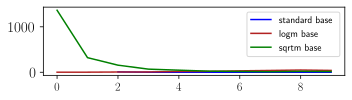

In [172]:
# make plots

plt.figure(figsize=(5, 1.5))
plt.plot(KL_results_linear_mean[:,0], label='standard base', color='blue')
plt.plot(KL_results_linear_mean[:,1], label='logm base', color='firebrick')
plt.plot(KL_results_linear_mean[:,2], label='sqrtm base', color='green')
plt.legend()
plt.tight_layout()

#plt.savefig('KL_incr_n_incr_Sigma.pdf')
plt.savefig('KL_Wishart.pdf')

plt.show();

# calculate MMD for growing ns and Vs and plot it

In [166]:
MMD_results_linear = []

for s in range(10):
    print("seed: ", s)
    np.random.seed(s)
    
    results_seed = []
    for nv_ in NVs:
        n_, v_ = nv_
        MMD_ = MMD_combinations(params = [[n_], [v_]], n_samples=2000)
        print(MMD_)
        results_seed.append(MMD_)
    
    MMD_results_linear.append(results_seed)

seed:  0
n:  2.5 V:  [[0.1839269  0.14557889]
 [0.14557889 0.11931407]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 5.859622814379952e-08
standard:  nan logm:  0.07138389348983765 sqrtm:  0.09674489498138428
(nan, 0.07138389348983765, 0.09674489498138428)
n:  3.0 V:  [[0.3678538  0.29115778]
 [0.29115778 0.23862815]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 3.824166730188729e-08


/home/marius/anaconda3/lib/python3.7/site-packages/scipy/stats/_multivariate.py:660: RuntimeWarning: covariance is not positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


standard:  nan logm:  0.07866909354925156 sqrtm:  0.08871740102767944
(nan, 0.07866909354925156, 0.08871740102767944)
n:  3.5 V:  [[0.5517807  0.43673667]
 [0.43673667 0.35794222]]
logm result may be inaccurate, approximate err = 7.876277846542259e-08
standard:  0.37930047512054443 logm:  0.08261080086231232 sqrtm:  0.0862991213798523
(0.37930047512054443, 0.08261080086231232, 0.0862991213798523)
n:  4.0 V:  [[0.7357076  0.58231556]
 [0.58231556 0.4772563 ]]
logm result may be inaccurate, approximate err = 7.663539395730825e-08
standard:  0.20472197234630585 logm:  0.07038967311382294 sqrtm:  0.0770767331123352
(0.20472197234630585, 0.07038967311382294, 0.0770767331123352)
n:  4.5 V:  [[0.91963446 0.7278944 ]
 [0.7278944  0.5965704 ]]
logm result may be inaccurate, approximate err = 6.586638594451307e-08
standard:  0.08696596324443817 logm:  0.06412652134895325 sqrtm:  0.06766033172607422
(0.08696596324443817, 0.06412652134895325, 0.06766033172607422)
n:  5.0 V:  [[1.1035614  0.8734733

standard:  nan logm:  0.07251192629337311 sqrtm:  0.08548891544342041
(nan, 0.07251192629337311, 0.08548891544342041)
n:  3.0 V:  [[0.3678538  0.29115778]
 [0.29115778 0.23862815]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 3.824166730188729e-08
standard:  nan logm:  0.08133935928344727 sqrtm:  0.08705037832260132
(nan, 0.08133935928344727, 0.08705037832260132)
n:  3.5 V:  [[0.5517807  0.43673667]
 [0.43673667 0.35794222]]
logm result may be inaccurate, approximate err = 7.876277846542259e-08
standard:  0.3623228669166565 logm:  0.07055455446243286 sqrtm:  0.07926571369171143
(0.3623228669166565, 0.07055455446243286, 0.07926571369171143)
n:  4.0 V:  [[0.7357076  0.58231556]
 [0.58231556 0.4772563 ]]
logm result may be inaccurate, approximate err = 7.663539395730825e-08
standard:  0.17825700342655182 logm:  0.07315392792224884 sqrtm:  0.07564598321914673
(0.17825700342655182, 0.07315392792224884, 0.07564598321914673)

standard:  0.011413119733333588 logm:  0.04973536729812622 sqrtm:  0.034592121839523315
(0.011413119733333588, 0.04973536729812622, 0.034592121839523315)
seed:  6
n:  2.5 V:  [[0.1839269  0.14557889]
 [0.14557889 0.11931407]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 5.859622814379952e-08
standard:  nan logm:  0.08148924261331558 sqrtm:  0.10731089115142822
(nan, 0.08148924261331558, 0.10731089115142822)
n:  3.0 V:  [[0.3678538  0.29115778]
 [0.29115778 0.23862815]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 3.824166730188729e-08
standard:  nan logm:  0.07072796672582626 sqrtm:  0.08489412069320679
(nan, 0.07072796672582626, 0.08489412069320679)
n:  3.5 V:  [[0.5517807  0.43673667]
 [0.43673667 0.35794222]]
logm result may be inaccurate, approximate err = 7.876277846542259e-08
standard:  0.3711930811405182 logm:  0.07343834638595581 sqrtm:  0.06

standard:  0.014484427869319916 logm:  0.05135619640350342 sqrtm:  0.04560008645057678
(0.014484427869319916, 0.05135619640350342, 0.04560008645057678)
n:  7.0 V:  [[1.839269  1.4557889]
 [1.4557889 1.1931407]]
logm result may be inaccurate, approximate err = 1.3523600419179475e-07
standard:  0.009873982518911362 logm:  0.05163043737411499 sqrtm:  0.03145518898963928
(0.009873982518911362, 0.05163043737411499, 0.03145518898963928)
seed:  9
n:  2.5 V:  [[0.1839269  0.14557889]
 [0.14557889 0.11931407]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 5.859622814379952e-08
standard:  nan logm:  0.07188273966312408 sqrtm:  0.09926575422286987
(nan, 0.07188273966312408, 0.09926575422286987)
n:  3.0 V:  [[0.3678538  0.29115778]
 [0.29115778 0.23862815]]
n <= p+1 doesn't yield a Laplace Approximation in standard basis
logm result may be inaccurate, approximate err = 3.824166730188729e-08
standard:  nan logm:  0.0723961666226387

In [167]:
# handle the data
MMD_results_linear = np.array(MMD_results_linear)

# take the mean over the 10 seeds
MMD_results_linear_mean = MMD_results_linear.mean(0)
print(np.shape(MMD_results_linear_mean))

(10, 3)


In [168]:
MMD_results_linear_mean

array([[       nan, 0.07407794, 0.09932358],
       [       nan, 0.07475848, 0.09026862],
       [0.35865578, 0.07269008, 0.0802975 ],
       [0.18165672, 0.07235093, 0.07148412],
       [0.09370798, 0.06730071, 0.05978137],
       [0.05198029, 0.06189278, 0.05193874],
       [0.03203313, 0.05839883, 0.04940314],
       [0.02087515, 0.05654396, 0.04357114],
       [0.01413799, 0.04988294, 0.03820977],
       [0.01085421, 0.04831462, 0.03593813]])

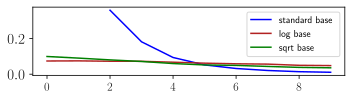

In [173]:
# make plots

plt.figure(figsize=(5, 1.5))
plt.plot(MMD_results_linear_mean[:,0], label='standard base', color='blue')
plt.plot(MMD_results_linear_mean[:,1], label='log base', color='firebrick')
plt.plot(MMD_results_linear_mean[:,2], label='sqrt base', color='green')
plt.legend()
plt.tight_layout()

#plt.savefig('MMD_incr_n_incr_Sigma.pdf')
plt.savefig('MMD_Wishart.pdf')

plt.show();